In [1]:
import sys
sys.path.insert(0, '../../stock_factor_lab/')

In [2]:
START_DATE = '2000'
END_DATE = '2009-3-31'

# 整理暑假的程式
比較新的版本
### 回測期間 - 2009 ~ 2024目前 

## import

In [3]:
from get_data import Data
import backtest
from combinations import sim_conditions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
# import plotly.graph_objs as go
import plotly.express as px
from itertools import cycle
from plotly.subplots import make_subplots
from matplotlib import rcParams
rcParams['font.sans-serif'] = ['Microsoft JhengHei']
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
from matplotlib.ticker import FuncFormatter
import matplotlib.dates as mdates
from datetime import datetime

# from dataframe import CustomDataFrame

import plot_data

## get data

In [4]:
data=Data()

---

## 一些有的沒的畫圖 function

### 每年 TopN (學長的那個 + 股票代號label、print出前幾名 list)

In [5]:
def analyze_top_stocks(rep, topN):
    trades_df = rep.trades
    trades_df["cum_return"] = (1 + trades_df['return']).groupby(trades_df['stock_id']).cumprod() - 1
    trades_df = trades_df.groupby('stock_id').last().reset_index()

    trades_df['entry_date'] = pd.to_datetime(trades_df['entry_date'])
    trades_df['year'] = trades_df['entry_date'].dt.year

    grouped = trades_df.groupby(['year', 'stock_id'])['cum_return'].last().reset_index()

    def process_year_group(group):
        top_stocks = group.nlargest(topN, 'cum_return')
        other_total = group[~group['stock_id'].isin(top_stocks['stock_id'])]['cum_return'].sum()
        other_row = pd.DataFrame({'year': [group['year'].iloc[0]],
                                  'stock_id': ['其他'],
                                  'cum_return': [other_total]})
        return pd.concat([top_stocks, other_row], ignore_index=True)

    final_data = grouped.groupby('year').apply(process_year_group).reset_index(drop=True)

    top_stocks_by_year = {}

    for year in final_data['year'].unique():
        year_data = final_data[final_data['year'] == year]
        top_stocks = year_data[year_data['stock_id'] != '其他']['stock_id'].tolist()
        top_stocks_by_year[year] = top_stocks

    fig = go.Figure()

    other_data = final_data[final_data['stock_id'] == '其他']
    if not other_data.empty:
        fig.add_trace(go.Bar(
            x=other_data['year'],
            y=other_data['cum_return'],
            name='其他',
            marker=dict(
                color='white',
                pattern_shape="/"
            )
        ))

    for stock_id in final_data['stock_id'].unique():
        if stock_id != '其他':
            stock_data = final_data[final_data['stock_id'] == stock_id]
            fig.add_trace(go.Bar(
                x=stock_data['year'],
                y=stock_data['cum_return'],
                name=f'{stock_id}',
                text=stock_id,
                textposition='inside'
            ))

    fig.update_layout(
        barmode='stack',
        title=f'年度前{topN}高報酬所佔全部比例',
        xaxis=dict(title='年份'),
        yaxis=dict(title='累積回報'),
        legend_title="公司代號"
    )

    print(f"每年前 {topN} 高的股票代號：")
    for year, stocks in top_stocks_by_year.items():
        print(f"{year}: {stocks}")

    return fig, top_stocks_by_year, final_data


# # 使用範例
# fig, top_stocks_by_year, final_data = analyze_top_stocks(roe_value_collc_pe_4y15rep, 5)
# fig.show()

---

## 資料下載

### **盈餘再投資率**

In [6]:
profit = data.get('annual_report_fundamentals:常續性稅後淨利')

In [7]:
# 抓資料
long_term_items = [
    '透過損益按公允價值衡量之金融資產－非流動',
    '透過其他綜合損益按公允價值衡量之金融資產－非流動',
    '按攤銷後成本衡量之金融資產－非流動',
    '避險之金融資產－非流動',
    '合約資產－非流動',
    '採權益法之長期股權投資',
    '預付投資款',
    '投資性不動產淨額'
]

# 長期投資項目 (8個)
long_term_data = [data.get(f'annual_report_fundamentals:{item}').fillna(0) for item in long_term_items]
long_term_investment = sum(long_term_data)
# 固定資產
fixed_assets_year = data.get('annual_report_fundamentals:不動產廠房及設備').fillna(0)

In [8]:
# 計算盈再率分子
long_term_investment_df = (long_term_investment - long_term_investment.shift(4))#['2000':].astype('int64')
fixed_assets_df = (fixed_assets_year - fixed_assets_year.shift(4))#['2000':].astype('int64')

In [9]:
profit_rol_df = profit.rolling(4).sum()#['2000':]

In [10]:
# 計算出盈再率
# 去掉淨利為負的公司 (當年度淨利為負、四年加總淨利為負都去掉)
rr = (long_term_investment_df + fixed_assets_df) / profit_rol_df
rr = rr[(profit > 0) & (profit_rol_df > 0)]

### 盈再率 - 數值分佈

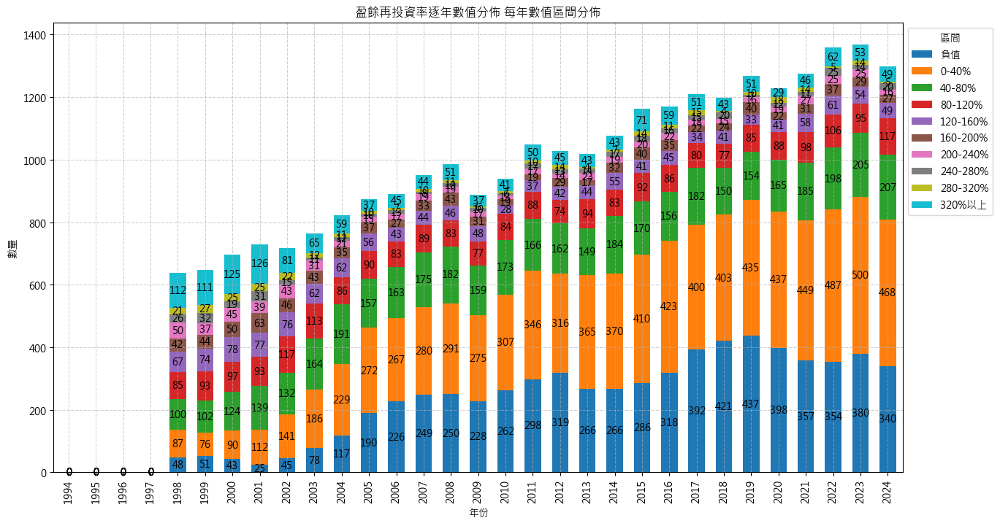

In [ ]:
plot_data.numeric_bins(rr, "盈餘再投資率逐年數值分佈", stacked=True, num_label=True,
                bins=[-np.inf, 0, 0.40, 0.80, 1.20, 1.60, 2.00, 2.40, 2.80, 3.20, np.inf], 
                labels=['負值' ,'0-40%', '40-80%', '80-120%', '120-160%', '160-200%', '200-240%', '240-280%', '280-320%', '320%以上'])

---

### **本益比 (P/E)**
- 每季資料
- 每日資料

In [12]:
pe = data.get('quarter_report:PE')[START_DATE:END_DATE]
daily_pe = data.get('price:daily_pe')[START_DATE:END_DATE]

### **其他因子**

- ROE (季資料，取第四季)
- 股利支付率 (只有年資料) ＝〈現金股利總額〈元〉／ 股利分配年度之稅後淨利〉x 100
- 董監持股 (沒有每年的資料，缺值採向前補值)
- 上市上櫃滿兩年

In [13]:
roe = data.get('annual_report:ROE')
payout_ratio = data.get('annual_report_fundamentals:股利支付率')

In [14]:
stock_hold = data.get('annual_report_fundamentals:董監持股%')

In [15]:
# listed_date = pd.read_csv('../2024_code/最近上市日.csv', encoding='cp950')

##### 上市上櫃滿兩年

In [16]:
close = data.get('price:close')
comp_profile = data.get('company_profile')



stock_data = {}

for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date_ = row['ipo_date']
    end_date = listed_date_ + pd.DateOffset(years=2)
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:end_date] = False
    
    stock_data[stock_code] = series

listed = pd.concat(stock_data, axis=1)

In [17]:
comp_profile

,company_symbol,name,ipo_date,industry
0,1101,台泥,1962-02-09,水泥工業
1,1102,亞泥,1962-06-18,水泥工業
2,1103,嘉泥,1969-11-27,水泥工業
3,1104,環泥,1971-02-02,水泥工業
4,1108,幸福,1990-06-06,水泥工業
...,...,...,...,...
1843,9951,皇田,2003-12-18,電機機械
1844,9955,佳龍,2008-01-21,綠能環保
1845,9958,世紀鋼,2008-03-12,鋼鐵工業
1846,9960,邁達康,2004-12-06,運動休閒


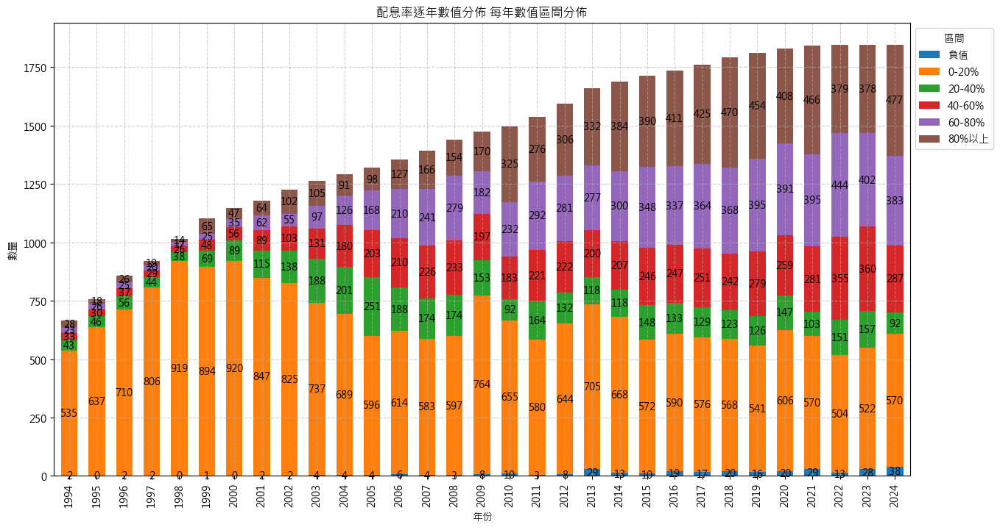

In [106]:
plot_data.numeric_bins(payout_ratio, "配息率逐年數值分佈", stacked=True, num_label=True,
                bins=[-np.inf, 0, 20, 40, 60, 80, np.inf], 
                labels=['負值' ,'0-20%', '20-40%', '40-60%', '60-80%', '80%以上'])

---

## 選股條件
- ROE 五年平均 > 15%
- 盈再率 < 80%
- 稅後淨利 > 五億
- 配息 > 40%
- 董監持股 > 10%
- 上市上櫃滿兩年
- PE < 12買入，>30賣出

In [18]:
# ROE 5年平均 > 15%
roe_rol = roe.rolling(5).mean()
roe_15 = (roe_rol > 15)[START_DATE:END_DATE]

In [19]:
rr_cond = (rr < 0.4)[START_DATE:END_DATE]

In [20]:
# *最近3年的配息率有無一年不及40%*
payout_ratio_cond = (payout_ratio.rolling(3).min() >= 40)[START_DATE:END_DATE]

# # 金融股看配息率，不看盈再率
# rr_cond[finance_stock_list] = payout_ratio_cond[finance_stock_list]

In [21]:
# 淨利 > 5億
profit_cond = (profit > 500000)[START_DATE:END_DATE] # TEJ 的淨利單位是千元

In [22]:
hold_cond = stock_hold[START_DATE:END_DATE] > 10

In [23]:
listed = listed.resample('M').last()[START_DATE:END_DATE]

---

## 原始條件 + 無本益比進出場條件

In [24]:
orig_all_cond = roe_15 & rr_cond & payout_ratio_cond & profit_cond & hold_cond & listed

---

In [25]:
# 原始條件、無本益比進出場

rep_all_cond = backtest.sim(orig_all_cond, resample='M', data=data)
rep_all_cond.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.27%,50.25,-53.93%,41.18%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1473,2003-04-01,2009-04-01,2003-03-31,2009-03-31,0.333333,1491,819,2310,-0.259782,-0.358219,1.018494,1.018494,-0.682050,1315.0,0.000000,0.000000
1477,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.050000,991,1319,2310,0.145771,-0.260041,2.106229,2.106229,-0.761782,838.0,0.000000,0.000000
2002,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.050000,991,1319,2310,0.100460,-0.210383,1.376140,0.015704,-0.572777,757.0,0.000000,0.000000
2027,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.024390,476,1834,2310,-0.643627,-0.745723,0.103093,0.103093,-0.769487,42.0,0.000000,0.000000
2029,2006-04-03,2009-04-01,2006-03-31,2009-03-31,0.029412,743,1567,2310,0.019550,-0.328110,0.530795,0.530795,-0.561084,503.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8046,2009-04-01,NaT,2009-03-31,NaT,0.018182,3813,2310,-1,1.621605,-0.686212,9.153406,0.880004,-0.833092,1725.0,0.018182,0.018182
8072,2009-04-01,NaT,2009-03-31,NaT,0.018182,3813,2310,-1,-0.397489,-0.614251,0.528405,0.528405,-0.747613,1390.0,0.018182,0.018182
8924,2005-04-01,NaT,2005-03-31,NaT,0.050000,4804,1319,-1,2.776022,-0.601674,5.249710,0.879408,-0.788058,2887.0,0.018182,0.018182


In [26]:
rep_all_cond.trades

,stock_id,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,return,mae,gmfe,bmfe,mdd,pdays
trade_index,,,,,,,,,,,,,
0,1726,2003-04-01,2004-04-01,2003-03-31,2004-03-31,0.333333,251,0.190634,-0.078164,0.306841,0.024262,-0.113333,202.0
1,2308,2004-04-01,2006-04-03,2004-03-31,2006-03-31,0.166667,497,1.264238,-0.045561,1.395871,0.038368,-0.151757,493.0
2,3060,2005-06-01,2006-04-03,2005-05-31,2006-03-31,0.047619,207,-0.128716,-0.249623,0.286096,0.286096,-0.416547,94.0
3,9941,2003-10-01,2006-04-03,2003-09-30,2006-03-31,0.250000,620,0.133385,-0.031585,0.311701,0.235100,-0.215922,616.0
4,1451,2006-04-03,2007-05-02,2006-03-31,2007-04-30,0.029412,267,0.173516,-0.167915,0.220510,0.075193,-0.226106,158.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,8046,2009-04-01,NaT,2009-03-31,NaT,0.018182,3813,1.621605,-0.686212,9.153406,0.880004,-0.833092,1725.0
85,8072,2009-04-01,NaT,2009-03-31,NaT,0.018182,3813,-0.397489,-0.614251,0.528405,0.528405,-0.747613,1390.0
86,8924,2005-04-01,NaT,2005-03-31,NaT,0.050000,4804,2.776022,-0.601674,5.249710,0.879408,-0.788058,2887.0


In [27]:
# rep_all_cond.trades.sort_values('stock_id', ascending=True).to_csv('../2024_code/exp_data/rep_all_cond_trades_2.csv', encoding='cp950')

In [28]:
# rep_all_cond.plot_holding_period_return()

In [67]:
all_cond_pos, al_cond_neg = rep_all_cond.calc_returns_contrib()

In [71]:
all_cond_pos[2008]

['2707',
 '5203',
 '5478',
 '9921',
 '5903',
 '3211',
 '9930',
 '9917',
 '2330',
 '3045',
 '5508',
 '2617',
 '4904']

## 原始條件 + 有本益比進出場

### 每季本益比進出場

In [29]:
# (每季)本益比條件

pe_cond_entry = pe < 12
pe_cond_exit = pe > 30

In [30]:
orig_all_cond_and_pe = ((orig_all_cond & pe_cond_entry).hold_until((~orig_all_cond) | pe_cond_exit))

In [31]:
rep_all_cond_and_pe = backtest.sim(orig_all_cond_and_pe, resample='M', data=data)
rep_all_cond_and_pe.get_stats()

{'CAGR': 0.09662694373369773,
 'daily_sharpe': 52.19,
 'max_drawdown': -0.5629055197171287,
 'avg_drawdown': -0.0899355318436352,
 'win_ratio': 0.5151515151515151,
 'ytd': 0.23851206173152129}

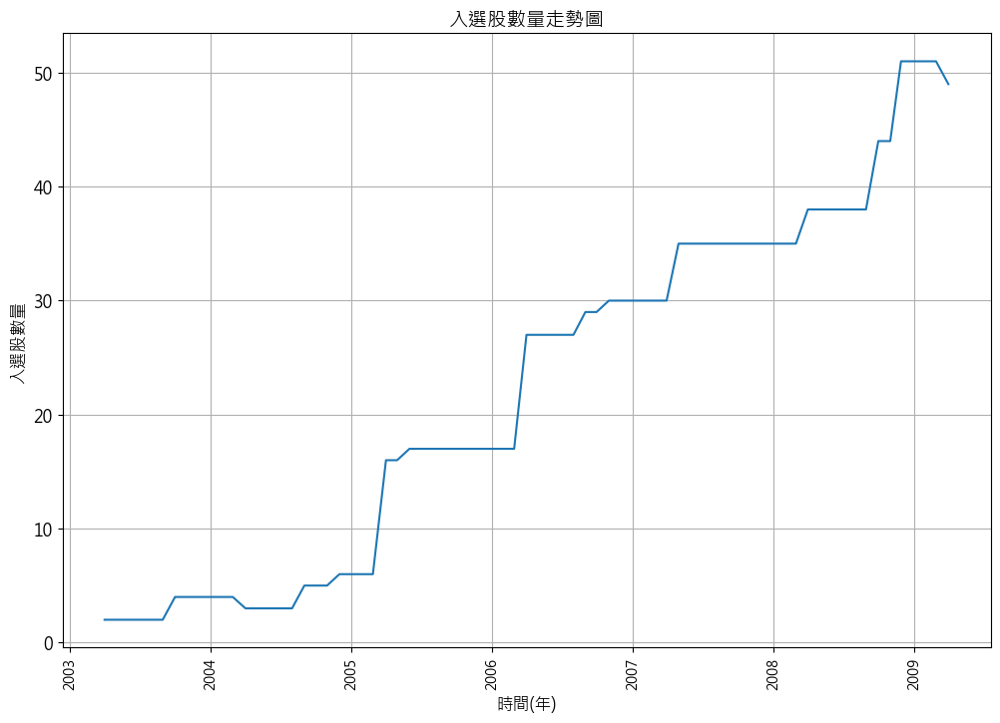

In [32]:
rep_all_cond_and_pe.plot_company_counts()

### 每月本益比進出場

In [33]:
# 每日本益比resample成每月
daily_pe_resample = daily_pe.resample('M').last()

pe_cond_entry_daily = daily_pe_resample < 12
pe_cond_exit_daily = daily_pe_resample > 30

In [34]:
orig_all_cond_and_pe_daily = ((orig_all_cond & pe_cond_entry_daily).hold_until((~orig_all_cond) | pe_cond_exit_daily))

rep_all_cond_and_pe_daily = backtest.sim(orig_all_cond_and_pe_daily, resample='M', data=data)
rep_all_cond_and_pe_daily.display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.4%,49.22,-55.18%,42.86%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1303,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.026316,249,2061,2310,-0.411847,-0.522974,0.043362,0.043362,-0.542799,21.0,0.000000,0.000000
1473,2003-04-01,2009-04-01,2003-03-31,2009-03-31,0.500000,1491,819,2310,-0.259782,-0.358219,1.018494,1.018494,-0.682050,1315.0,0.000000,0.000000
1477,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.071429,991,1319,2310,0.145771,-0.260041,2.106229,2.106229,-0.761782,838.0,0.000000,0.000000
2002,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.071429,991,1319,2310,0.100460,-0.210383,1.376140,0.015704,-0.572777,757.0,0.000000,0.000000
2027,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.028571,476,1834,2310,-0.643627,-0.745723,0.103093,0.103093,-0.769487,42.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8046,2009-04-01,NaT,2009-03-31,NaT,0.021739,3813,2310,-1,1.621605,-0.686212,9.153406,0.880004,-0.833092,1725.0,0.021739,0.021739
8072,2009-04-01,NaT,2009-03-31,NaT,0.021739,3813,2310,-1,-0.397489,-0.614251,0.528405,0.528405,-0.747613,1390.0,0.021739,0.021739
8924,2005-04-01,NaT,2005-03-31,NaT,0.071429,4804,1319,-1,2.776022,-0.601674,5.249710,0.879408,-0.788058,2887.0,0.021739,0.021739


In [35]:
# all_cond_pos_ret, all_cond_neg_ret = rep_all_cond_and_pe_daily.calc_returns_contrib(5)

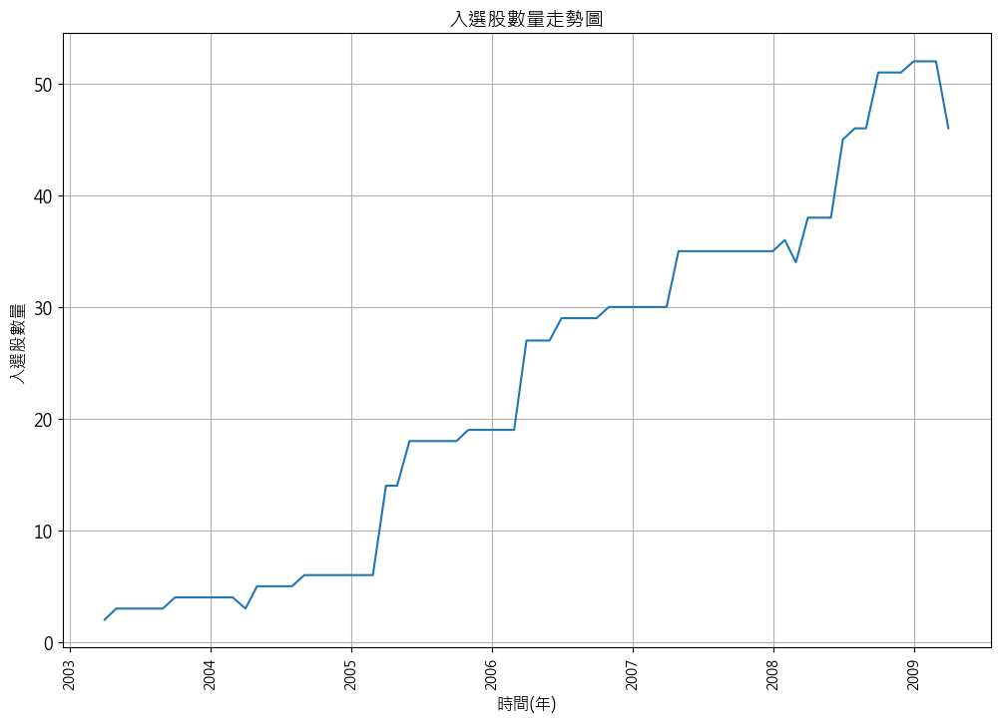

In [108]:
rep_all_cond_and_pe_daily.plot_company_counts()

---

## 綜合比較入選股數變化

In [36]:
all_cond_reps = {}

all_cond_reps['原始條件_無本益比進出場'] = orig_all_cond
all_cond_reps['原始條件_每季本益比'] = orig_all_cond_and_pe
all_cond_reps['原始條件_每日本益比'] = orig_all_cond_and_pe_daily


rep_collecs = sim_conditions(all_cond_reps, resample='M', data=data)
# rep_collecs.plot_creturns()

Backtesting progress:   0%|          | 0/3 [00:00<?, ?condition/s]

Backtesting progress: 100%|██████████| 3/3 [00:05<00:00,  1.90s/condition]


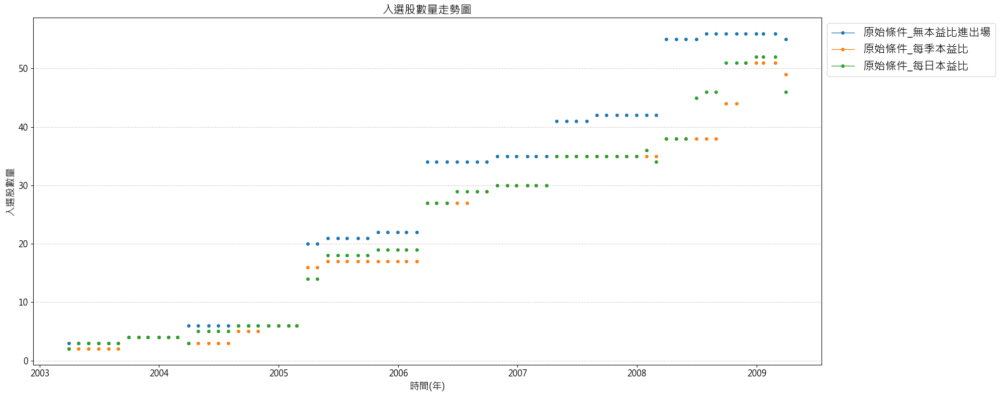

In [37]:
rep_collecs.plot_reps_stock_counts()

In [38]:
# rep = rep_collecs.reports['原始條件_無本益比進出場']

# df_stats_cagr = rep.get_stats()['CAGR']
# df_stats_mdd = rep.get_stats()['max_drawdown']

In [39]:
# df = rep_collecs.reports['原始條件_無本益比進出場'].trades.copy()
# df = df[['stock_id', 'entry_date', 'exit_date']]
# # 獲取 price:close 資料中的最後一個日期
# last_date = rep.cashflow.index[-1]
# # 將 exit_date 為 NaT 的行補上最後一個日期
# df['exit_date'].fillna(last_date, inplace=True)

# # 計算持有期
# df['holding_periods'] = (df['exit_date'] - df['entry_date']).dt.days

# df

In [40]:
# # 計算 df['holding_periods'] 的平均、中位數、最大值、最小值、25%、75%分位數
# holding_stat_df = {
#     'CAGR': df_stats_cagr,
#     'MDD': df_stats_mdd,
#     '平均': df['holding_periods'].mean(),
#     '25%': df['holding_periods'].quantile(0.25),
#     '中位數': df['holding_periods'].median(),
#     '75%': df['holding_periods'].quantile(0.75),
#     '最大值': df['holding_periods'].max(),
#     '最小值': df['holding_periods'].min(),
# }

# holding_stat_df

In [41]:
rep_collecs.holding_period_analysis()

,CAGR (%),MDD (%),持有期間平均,25%,中位數,75%,最大值,最小值
Strategy,,,,,,,,
原始條件_每日本益比,11.40,-55.18,615.703704,216.0,366.0,1067.0,2192,-1
原始條件_無本益比進出場,11.27,-53.93,663.561798,364.0,394.0,1093.0,2192,-1
原始條件_每季本益比,9.66,-56.29,581.792683,120.0,365.5,1055.5,2192,-1


---

## ROE 參數最佳化 + 有無本益比進出場

In [115]:
pe_cond_entry = daily_pe_resample < 12
pe_cond_exit = daily_pe_resample > 30



roe_value_cond = {}
no_roe_conds = rr_cond & profit_cond & hold_cond & listed & payout_ratio_cond

for i in range(10, 26, 5): # 大於 10~25%
    for n in range(3, 6): # 3, 4, 5年平均
        
        roe_rolling = roe.rolling(n).mean()
        roe_cond_opt = (roe_rolling > i)[START_DATE:END_DATE]

        # roe_value_cond[f'roe_{n}y_{i} 無本益比進出場'] = (roe_cond_opt & no_roe_conds)[START_DATE:END_DATE]
        roe_value_cond[f'roe_{n}y_{i} 有本益比進出場'] = ((roe_cond_opt &  no_roe_conds & pe_cond_entry).hold_until((~(roe_cond_opt &  no_roe_conds)) | pe_cond_exit))[START_DATE:END_DATE]
        
roe_collection = sim_conditions(roe_value_cond, resample='M', data=data)


Backtesting progress: 100%|██████████| 12/12 [01:14<00:00,  6.17s/condition]


In [116]:
roe_collection.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
roe_3y_20 有本益比進出場,14.09,-56.39,14.500000,17.0,2.00,22.25,1.0,35.0
roe_3y_10 有本益比進出場,12.83,-53.08,24.750000,24.0,5.75,43.00,1.0,67.0
roe_4y_10 有本益比進出場,12.59,-53.50,24.000000,24.0,5.75,41.00,1.0,66.0
roe_4y_20 有本益比進出場,12.51,-58.90,13.041667,14.0,2.00,21.00,1.0,33.0
roe_3y_15 有本益比進出場,11.63,-56.50,24.575342,31.0,6.00,36.00,2.0,51.0
roe_4y_15 有本益比進出場,11.55,-55.88,23.424658,28.0,6.00,36.00,1.0,53.0
roe_5y_20 有本益比進出場,11.54,-58.04,12.000000,11.0,3.00,19.00,1.0,31.0
roe_5y_15 有本益比進出場,11.40,-55.18,23.109589,27.0,6.00,35.00,2.0,52.0
roe_4y_25 有本益比進出場,10.43,-62.27,10.065574,11.0,4.00,15.00,1.0,22.0


In [121]:
roe_collection.reports['roe_5y_25 有本益比進出場'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,6.35%,58.84,-61.87%,38.46%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1477,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.200000,991,1319,2310,0.145771,-0.260041,2.106229,2.106229,-0.761782,838.0,0.000000,0.000000
3010,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.071429,476,1834,2310,-0.522598,-0.631761,0.276960,0.276960,-0.711628,205.0,0.000000,0.000000
6188,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.071429,476,1834,2310,-0.206259,-0.441378,0.473064,0.473064,-0.620775,215.0,0.000000,0.000000
6206,2008-07-01,2009-04-01,2008-06-30,2009-03-31,0.058824,186,2124,2310,-0.201893,-0.446088,0.142638,0.142638,-0.515234,40.0,0.000000,0.000000
6277,2005-11-01,2009-04-01,2005-10-31,2009-03-31,0.142857,845,1465,2310,-0.124341,-0.223336,2.078431,2.078431,-0.747708,700.0,0.000000,0.000000
6505,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.071429,249,2061,2310,-0.190002,-0.317677,0.107955,0.107955,-0.384160,53.0,0.000000,0.000000
1565,2009-04-01,NaT,2009-03-31,NaT,0.055556,3813,2310,-1,2.196460,-0.086614,10.296204,0.015748,-0.768261,3762.0,0.055556,0.055556
1723,2005-04-01,NaT,2005-03-31,NaT,0.200000,4804,1319,-1,5.496392,-0.114369,7.093658,0.049635,-0.498136,4621.0,0.055556,0.055556
2451,2005-06-01,NaT,2005-05-31,NaT,0.166667,4763,1360,-1,4.394879,-0.299976,5.681960,1.766259,-0.746942,4471.0,0.055556,0.055556


---

---

## **每月**本益比資料 - 比較不同resample週期

In [44]:
daily_pe_entry = daily_pe < 12
daily_pe_exit = daily_pe > 30

---

---

## 比較有無某項條件績效差異

### 分成有無進出場條件兩組

In [45]:
compare_conds_strat_PE={}

In [46]:
## 比較有無某項條件績效差異

## 單一條件 

# rr_cond
# roe_15

## 比較有無某項條件績效差異 (都有本益比進出場)
sig_1 = (rr_cond & payout_ratio_cond)[START_DATE:END_DATE]
sig_2 = (rr_cond & payout_ratio_cond & hold_cond & listed)[START_DATE:END_DATE]
sig_3 = (rr_cond & payout_ratio_cond & hold_cond)[START_DATE:END_DATE]
sig_4 = (rr_cond & payout_ratio_cond & profit_cond & listed)[START_DATE:END_DATE]
sig_5 = (rr_cond & payout_ratio_cond & profit_cond)[START_DATE:END_DATE]
sig_6 = (roe_15 & rr_cond & profit_cond & hold_cond & listed)[START_DATE:END_DATE]
sig_7 = (roe_15 & rr_cond & hold_cond & listed)[START_DATE:END_DATE]
sig_8 = (rr_cond & profit_cond)[START_DATE:END_DATE]
sig_9 = (roe_15 & rr_cond & profit_cond)[START_DATE:END_DATE]
sig_10 = (roe_15 & rr_cond & payout_ratio_cond)[START_DATE:END_DATE]
sig_11 = (rr_cond & roe_15)[START_DATE:END_DATE]
sig_12 = (roe_15 & payout_ratio_cond & profit_cond & hold_cond & listed)[START_DATE:END_DATE]

In [47]:
# 策略dict (有本益比進出場)
compare_conds_strat_PE['盈再率+配息率'] = (sig_1 & pe_cond_entry_daily).hold_until(~sig_1 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+配息率+董監持股+上市櫃兩年'] = (sig_2 & pe_cond_entry_daily).hold_until(~sig_2 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+配息率+董監持股'] = (sig_3 & pe_cond_entry_daily).hold_until(~sig_3 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+配息率+淨利+上市櫃兩年'] = (sig_4 & pe_cond_entry_daily).hold_until(~sig_4 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+配息率+淨利'] = (sig_5 & pe_cond_entry_daily).hold_until(~sig_5 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率+淨利+董監持股+上市櫃兩年'] = (sig_6 & pe_cond_entry_daily).hold_until(~sig_6 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率+董監持股+上市櫃兩年'] = (sig_7 & pe_cond_entry_daily).hold_until(~sig_7 | pe_cond_exit_daily)
compare_conds_strat_PE['盈再率+淨利'] = (sig_8 & pe_cond_entry_daily).hold_until(~sig_8 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率+淨利'] = (sig_9 & pe_cond_entry_daily).hold_until(~sig_9 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率+配息率'] = (sig_10 & pe_cond_entry_daily).hold_until(~sig_10 | pe_cond_exit_daily)
compare_conds_strat_PE['ROE+盈再率'] = (sig_11 & pe_cond_entry_daily).hold_until(~sig_11 | pe_cond_exit_daily)
compare_conds_strat_PE['去掉盈再率'] = (sig_12 & pe_cond_entry_daily).hold_until(~sig_12 | pe_cond_exit_daily)
compare_conds_strat_PE['原始條件_有本益比進出場'] = orig_all_cond_and_pe_daily
# compare_conds_strat_PE['原始條件_無本益比進出場'] = orig_all_cond

compare_PE_strat_collecs = sim_conditions(compare_conds_strat_PE, resample='M', data=data)
compare_PE_strat_collecs.plot_stats('heatmap')

Backtesting progress: 100%|██████████| 13/13 [00:51<00:00,  3.98s/condition]


,CAGR,daily_sharpe,max_drawdown,avg_drawdown,win_ratio,ytd
原始條件_有本益比進出場,0.114003,49.220000,-0.551804,-0.085243,0.428571,0.229991
盈再率+配息率+淨利+上市櫃兩年,0.071449,33.030000,-0.543183,-0.163378,0.449275,0.218576
盈再率+配息率+董監持股+上市櫃兩年,0.069563,36.460000,-0.547947,-0.157582,0.607407,0.210278
ROE+盈再率+淨利+董監持股+上市櫃兩年,0.065423,49.590000,-0.575899,-0.128270,0.428571,0.263461
ROE+盈再率+董監持股+上市櫃兩年,0.063341,55.110000,-0.615810,-0.154920,0.500000,0.263276
盈再率+淨利,0.060786,39.400000,-0.573428,-0.164405,0.434555,0.248522
去掉盈再率,0.058058,53.420000,-0.546408,-0.123183,0.346939,0.211686
盈再率+配息率+董監持股,0.056434,37.470000,-0.550763,-0.176360,0.596273,0.211203
盈再率+配息率,0.049935,36.800000,-0.557181,-0.184495,0.562874,0.216182
盈再率+配息率+淨利,0.047805,36.120000,-0.542494,-0.185221,0.428571,0.220936


In [48]:
compare_PE_strat_collecs.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
原始條件_有本益比進出場,11.40,-55.18,23.109589,27.0,6.00,35.00,2.0,52.0
盈再率+配息率+淨利+上市櫃兩年,7.14,-54.32,28.150943,13.0,2.00,53.75,1.0,86.0
盈再率+配息率+董監持股+上市櫃兩年,6.96,-54.79,60.330189,41.5,12.25,101.00,1.0,169.0
ROE+盈再率+淨利+董監持股+上市櫃兩年,6.54,-57.59,28.606061,25.0,4.00,42.00,1.0,68.0
ROE+盈再率+董監持股+上市櫃兩年,6.33,-61.58,60.000000,56.0,8.00,105.00,1.0,139.0
盈再率+淨利,6.08,-57.34,59.605505,46.0,13.00,102.00,2.0,137.0
去掉盈再率,5.81,-54.64,26.935484,28.0,4.00,49.00,1.0,78.0
盈再率+配息率+董監持股,5.64,-55.08,70.509434,51.0,16.50,116.00,1.0,189.0
盈再率+配息率,4.99,-55.72,75.485981,50.0,16.00,124.00,1.0,213.0


In [122]:
compare_PE_strat_collecs.reports['盈再率+配息率+淨利+上市櫃兩年'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,7.14%,33.03,-54.32%,44.93%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1101,2006-04-03,2009-04-01,2006-03-31,2009-03-31,0.021739,743,1567,2310,0.437894,-0.268313,1.807116,1.807116,-0.739345,630.0,0.000000,0.000000
1232,2008-05-02,2009-04-01,2008-04-30,2009-03-31,0.015625,228,2082,2310,-0.272085,-0.467530,0.142858,0.142858,-0.534089,35.0,0.000000,0.000000
1303,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.016393,249,2061,2310,-0.411847,-0.522974,0.043362,0.043362,-0.542799,21.0,0.000000,0.000000
1307,2008-05-02,2009-04-01,2008-04-30,2009-03-31,0.015625,228,2082,2310,-0.149675,-0.371461,0.116029,0.116029,-0.436808,28.0,0.000000,0.000000
1451,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.016393,249,2061,2310,-0.540121,-0.637249,0.033490,0.033490,-0.649004,9.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,2008-10-01,NaT,2008-09-30,NaT,0.011765,3935,2188,-1,1.501635,-0.239341,2.702305,0.016392,-0.754442,3755.0,0.015152,0.015152
9917,2008-10-01,NaT,2008-09-30,NaT,0.011765,3935,2188,-1,5.448780,-0.234411,5.945744,0.064518,-0.280811,3824.0,0.015152,0.015152
9925,2005-04-01,NaT,2005-03-31,NaT,0.034483,4804,1319,-1,5.986338,-0.143122,6.109282,1.308041,-0.628742,4678.0,0.015152,0.015152


In [50]:
# compare_PE_strat_collecs.holding_period_analysis()

In [51]:
compare_conds_strat = {}

# 策略dict (無本益比進出場)
compare_conds_strat['盈再率+配息率'] = sig_1
compare_conds_strat['盈再率+配息率+董監持股+上市櫃兩年'] = sig_2
compare_conds_strat['盈再率+配息率+董監持股'] = sig_3
compare_conds_strat['盈再率+配息率+淨利+上市櫃兩年'] = sig_4
compare_conds_strat['盈再率+配息率+淨利'] = sig_5
compare_conds_strat['ROE+盈再率+淨利+董監持股+上市櫃兩年'] = sig_6
compare_conds_strat['ROE+盈再率+董監持股+上市櫃兩年'] = sig_7
compare_conds_strat['盈再率+淨利'] = sig_8
compare_conds_strat['ROE+盈再率+淨利'] = sig_9
compare_conds_strat['ROE+盈再率+配息率'] = sig_10
compare_conds_strat['ROE+盈再率'] = sig_11
compare_conds_strat['原始條件_無本益比進出場'] = orig_all_cond
compare_conds_strat['只看ROE五年平均>15%'] = roe_15
compare_conds_strat['只看盈再率<0.4'] = rr_cond

compare_strat_collecs = sim_conditions(compare_conds_strat, resample='M', data=data)
compare_strat_collecs.plot_stats('heatmap')

Backtesting progress: 100%|██████████| 14/14 [01:37<00:00,  6.95s/condition]


,CAGR,daily_sharpe,max_drawdown,avg_drawdown,win_ratio,ytd
原始條件_無本益比進出場,0.112686,50.250000,-0.539349,-0.084199,0.411765,0.217966
盈再率+配息率+淨利+上市櫃兩年,0.081107,30.890000,-0.544615,-0.163492,0.418919,0.213140
盈再率+配息率+董監持股+上市櫃兩年,0.071417,36.090000,-0.537997,-0.151682,0.531250,0.206352
盈再率+配息率+董監持股,0.065775,39.740000,-0.538446,-0.134286,0.489796,0.200108
盈再率+配息率,0.062801,39.690000,-0.550175,-0.138435,0.460396,0.206742
盈再率+配息率+淨利,0.053352,34.590000,-0.544615,-0.175742,0.378049,0.215535
只看盈再率<0.4,0.046853,45.910000,-0.568377,-0.142174,0.383901,0.221752
盈再率+淨利,0.041071,43.370000,-0.576960,-0.160269,0.394089,0.241674
ROE+盈再率+配息率,0.039977,58.590000,-0.603089,-0.148907,0.420455,0.234346
ROE+盈再率,0.013079,54.130000,-0.621026,-0.160102,0.350195,0.256442


In [52]:
compare_strat_collecs.reports['盈再率+配息率+董監持股+上市櫃兩年'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,7.14%,36.09,-53.8%,53.12%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1101,2006-04-03,2009-04-01,2006-03-31,2009-03-31,0.008264,743,1567,2310,0.437894,-0.268313,1.807116,1.807116,-0.739345,630.0,0.000000,0.000000
1110,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.006173,476,1834,2310,-0.162892,-0.386861,0.737453,0.737453,-0.647105,269.0,0.000000,0.000000
1219,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.005236,249,2061,2310,-0.272156,-0.493835,0.570308,0.570308,-0.677665,78.0,0.000000,0.000000
1307,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.006173,476,1834,2310,-0.076315,-0.317606,0.219642,0.219642,-0.440496,220.0,0.000000,0.000000
1325,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.005236,249,2061,2310,-0.189276,-0.417079,0.286260,0.286260,-0.546810,48.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9930,2006-04-03,NaT,2006-03-31,NaT,0.008264,4556,1567,-1,7.618883,-0.011491,8.523685,0.000000,-0.467763,4551.0,0.005155,0.005155
9933,2008-04-01,NaT,2008-03-31,NaT,0.005236,4062,2061,-1,3.854704,-0.194987,4.507943,0.159278,-0.466232,3896.0,0.005155,0.005155
9937,2008-04-01,NaT,2008-03-31,NaT,0.005236,4062,2061,-1,4.315095,-0.375609,5.040831,0.166380,-0.464676,3757.0,0.005155,0.005155


In [53]:
compare_strat_collecs.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
原始條件_無本益比進出場,11.27,-53.93,27.369863,34.0,6.0,42.0,3.0,56.0
盈再率+配息率+淨利+上市櫃兩年,8.11,-54.46,33.256881,14.0,3.0,60.0,3.0,97.0
盈再率+配息率+董監持股+上市櫃兩年,7.14,-53.80,79.733945,54.0,19.0,127.0,6.0,197.0
盈再率+配息率+董監持股,6.58,-53.84,98.220183,71.0,31.0,153.0,11.0,225.0
盈再率+配息率,6.28,-55.02,105.871560,72.0,31.0,164.0,12.0,252.0
盈再率+配息率+淨利,5.34,-54.46,35.440367,15.0,4.0,60.0,3.0,103.0
只看盈再率<0.4,4.69,-56.84,344.091743,346.0,186.0,493.0,133.0,541.0
盈再率+淨利,4.11,-57.70,76.752294,58.0,19.0,120.0,16.0,159.0
ROE+盈再率+配息率,4.00,-60.31,46.110092,17.0,2.0,80.0,0.0,139.0


---

In [54]:
payout_per_opts = {}

conds_without_roe_payout = rr_cond & profit_cond & hold_cond & listed

for i in range(0, 46, 5):
    for j in range(10, 21, 2):
        for k in range(10, 26, 5):

            roe_cond_opt = (roe.rolling(5).mean() > k)[START_DATE:END_DATE]

            payout_ratio_cond_opt = (payout_ratio.rolling(3).min() >= i)[START_DATE:END_DATE]
            per_entry_opt = daily_pe_resample < j

            opt_payout_PER_cond = roe_cond_opt & payout_ratio_cond_opt & conds_without_roe_payout
            
            payout_per_opts[f'配息_{i}%_PE_{j}_ROE_{k}'] = (opt_payout_PER_cond & per_entry_opt).hold_until((~opt_payout_PER_cond) | pe_cond_exit_daily)

payout_PER_opts_comb = sim_conditions(payout_per_opts, resample='M', data=data)

Backtesting progress: 100%|██████████| 240/240 [10:45<00:00,  2.69s/condition]


In [55]:
# payout_PER_opts_comb.reports['配息_45%_PE_12'].display()

In [56]:
payout_PER_opts_comb.reports['配息_45%_PE_12_ROE_15'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.89%,46.93,-55.21%,47.06%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1303,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.026316,249,2061,2310,-0.411847,-0.522974,0.043362,0.043362,-0.542799,21.0,0.000000,0.000000
1473,2004-04-01,2009-04-01,2004-03-31,2009-03-31,0.333333,1240,1070,2310,-0.410239,-0.487645,0.611431,0.611431,-0.682050,542.0,0.000000,0.000000
1477,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.090909,991,1319,2310,0.145771,-0.260041,2.106229,2.106229,-0.761782,838.0,0.000000,0.000000
2002,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.090909,991,1319,2310,0.100460,-0.210383,1.376140,0.015704,-0.572777,757.0,0.000000,0.000000
2027,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.029412,476,1834,2310,-0.643627,-0.745723,0.103093,0.103093,-0.769487,42.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6202,2006-11-01,NaT,2006-10-31,NaT,0.037037,4409,1714,-1,1.587840,-0.664235,4.629223,0.621615,-0.792944,2790.0,0.023256,0.023256
8046,2009-04-01,NaT,2009-03-31,NaT,0.023256,3813,2310,-1,1.621605,-0.686212,9.153406,0.880004,-0.833092,1725.0,0.023256,0.023256
8924,2005-04-01,NaT,2005-03-31,NaT,0.090909,4804,1319,-1,2.776022,-0.601674,5.249710,0.879408,-0.788058,2887.0,0.023256,0.023256


In [98]:
payout_PER_opts_comb.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
配息_25%_PE_12_ROE_25,17.18,-59.84,16.178571,15.0,12.75,22.25,1.0,27.0
配息_20%_PE_12_ROE_25,15.26,-60.29,13.465753,13.0,3.00,23.00,1.0,29.0
配息_25%_PE_14_ROE_25,15.07,-62.55,17.303571,15.0,13.75,25.00,1.0,27.0
配息_35%_PE_10_ROE_20,14.37,-57.64,10.875000,8.0,2.00,16.25,0.0,34.0
配息_35%_PE_12_ROE_20,14.02,-56.72,14.219178,13.0,3.00,24.00,1.0,35.0
...,...,...,...,...,...,...,...,...
配息_5%_PE_10_ROE_25,-0.22,-63.35,13.728814,11.0,9.00,18.00,2.0,29.0
配息_0%_PE_12_ROE_25,-0.33,-64.49,12.353535,12.0,2.00,18.00,1.0,31.0
配息_0%_PE_20_ROE_25,-1.50,-66.99,13.504854,13.0,2.00,18.00,1.0,32.0


In [57]:
df_test = payout_PER_opts_comb.selected_stock_count_analysis()
# filter 'Min' <=0
df_test[df_test['Min'] > 0]

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
配息_25%_PE_12_ROE_25,17.18,-59.84,16.178571,15.0,12.75,22.25,1.0,27.0
配息_20%_PE_12_ROE_25,15.26,-60.29,13.465753,13.0,3.00,23.00,1.0,29.0
配息_25%_PE_14_ROE_25,15.07,-62.55,17.303571,15.0,13.75,25.00,1.0,27.0
配息_35%_PE_12_ROE_20,14.02,-56.72,14.219178,13.0,3.00,24.00,1.0,35.0
配息_45%_PE_12_ROE_20,13.86,-58.31,11.152778,9.0,2.00,18.00,1.0,30.0
...,...,...,...,...,...,...,...,...
配息_5%_PE_10_ROE_25,-0.22,-63.35,13.728814,11.0,9.00,18.00,2.0,29.0
配息_0%_PE_12_ROE_25,-0.33,-64.49,12.353535,12.0,2.00,18.00,1.0,31.0
配息_0%_PE_20_ROE_25,-1.50,-66.99,13.504854,13.0,2.00,18.00,1.0,32.0


---

In [132]:
# payout_PER_opts_comb.reports['配息_35%_PE_12_ROE_15'].display()

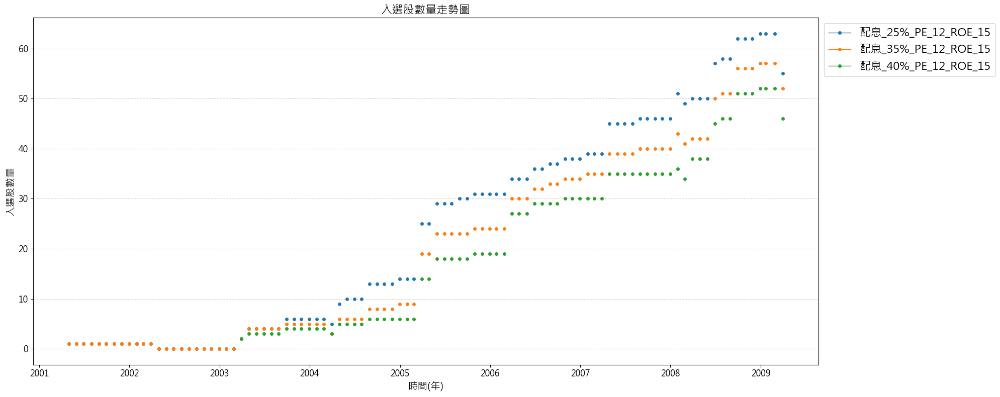

In [83]:
payout_PER_opts_comb.plot_reps_stock_counts(['配息_25%_PE_12_ROE_15', '配息_35%_PE_12_ROE_15', '配息_40%_PE_12_ROE_15'])

In [102]:
pos, neg = payout_PER_opts_comb.reports['配息_35%_PE_12_ROE_15'].calc_returns_contrib()

In [74]:
payout_per_rr_opts = {}

conds_without_roe_payout_rr = profit_cond & hold_cond & listed

for i in [0, 10, 20, 30, 40]:
    for j in range(10, 21, 2):
        for k in range(10, 26, 5):

            roe_cond_opt = (roe.rolling(5).mean() > k)

            # 有配息就好
            payout_ratio_cond_opt = (payout_ratio.rolling(3).min() >= 0)
            per_entry_opt = daily_pe_resample < j
            rr_cond_opt = rr < (i/100)

            opt_payout_PER_rr_cond = (rr_cond_opt & roe_cond_opt & payout_ratio_cond_opt & conds_without_roe_payout_rr)[START_DATE:END_DATE]
            
            payout_per_rr_opts[f'盈再率小於{i}_PE_{j}_ROE_5y_{k}%'] = (opt_payout_PER_rr_cond & per_entry_opt).hold_until((~opt_payout_PER_rr_cond) | pe_cond_exit_daily)

payout_PER_rr_opts_comb = sim_conditions(payout_per_rr_opts, resample='M', data=data)
payout_PER_rr_opts_comb.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 120/120 [09:19<00:00,  4.66s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率小於0_PE_20_ROE_5y_20%,17.38,-64.53,7.594595,9.0,3.00,10.00,3.0,12.0
盈再率小於0_PE_16_ROE_5y_20%,17.38,-64.53,7.594595,9.0,3.00,10.00,3.0,12.0
盈再率小於0_PE_18_ROE_5y_20%,17.38,-64.53,7.594595,9.0,3.00,10.00,3.0,12.0
盈再率小於0_PE_12_ROE_5y_25%,16.53,-71.02,3.972973,5.0,1.00,6.00,1.0,7.0
盈再率小於0_PE_14_ROE_5y_25%,15.75,-70.49,4.108108,5.0,1.00,6.00,1.0,7.0
...,...,...,...,...,...,...,...,...
盈再率小於20_PE_20_ROE_5y_25%,-2.90,-68.45,10.011905,9.5,3.00,19.00,1.0,21.0
盈再率小於10_PE_20_ROE_5y_25%,-2.97,-65.64,7.438356,7.0,2.00,13.00,1.0,18.0
盈再率小於20_PE_18_ROE_5y_25%,-2.99,-68.34,9.964286,9.5,3.00,19.00,1.0,21.0


In [126]:
payout_PER_rr_opts_comb.reports['盈再率小於0_PE_12_ROE_5y_15%'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,10.22%,37.82,-62.09%,57.14%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
2006,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.066667,476,1834,2310,-0.154671,-0.475030,0.815382,0.815382,-0.710821,332.0,0.000000,0.000000
2029,2006-04-03,2009-04-01,2006-03-31,2009-03-31,0.100000,743,1567,2310,0.019550,-0.328110,0.530795,0.530795,-0.561084,503.0,0.000000,0.000000
2103,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.066667,476,1834,2310,0.242643,-0.194130,1.071473,1.071473,-0.610968,408.0,0.000000,0.000000
2401,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.062500,249,2061,2310,-0.508649,-0.679926,0.148147,0.148147,-0.721226,47.0,0.000000,0.000000
2606,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.200000,991,1319,2310,0.803526,-0.212675,2.655578,0.025237,-0.695626,664.0,0.000000,0.000000
3033,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.066667,476,1834,2310,-0.396491,-0.622382,0.269396,0.269396,-0.702521,130.0,0.000000,0.000000
5203,2009-01-05,2009-04-01,2008-12-31,2009-03-31,0.052632,57,2253,2310,0.044783,-0.063292,0.071730,0.021097,-0.082646,34.0,0.000000,0.000000
5508,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.066667,476,1834,2310,-0.050296,-0.355731,1.001720,1.001720,-0.678142,269.0,0.000000,0.000000
5534,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.066667,476,1834,2310,-0.105972,-0.608221,1.139846,1.139846,-0.816912,325.0,0.000000,0.000000


In [61]:
per_rr_roe_opts = {}

conds_without_roe_payout_rr = profit_cond & hold_cond & listed

for i in [0, 10, 20, 30, 40]:
    for j in range(10, 21, 2):
        for k in range(10, 26, 5):

            roe_cond_opt = (roe.rolling(5).mean() > k)

            # payout_ratio_cond_opt = (payout_ratio.rolling(3).min() >= 0)
            per_entry_opt = daily_pe_resample < j
            rr_cond_opt = rr < (i/100)

            opt_PER_rr_roe_cond = rr_cond_opt & roe_cond_opt & conds_without_roe_payout_rr
            
            per_rr_roe_opts[f'盈再率小於{i}_PE_{j}_ROE_5y_{k}%'] = (opt_PER_rr_roe_cond & per_entry_opt).hold_until((~opt_PER_rr_roe_cond) | pe_cond_exit_daily)

PER_rr_roe_opts_comb = sim_conditions(per_rr_roe_opts, resample='M', data=data)
PER_rr_roe_opts_comb.selected_stock_count_analysis()

Backtesting progress: 100%|██████████| 120/120 [08:46<00:00,  4.39s/condition]


,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率小於0_PE_20_ROE_5y_10%,12.99,-58.44,14.574394,18.0,9.0,21.0,1.0,28.0
盈再率小於0_PE_18_ROE_5y_10%,12.92,-58.44,14.446367,17.0,9.0,20.0,1.0,28.0
盈再率小於10_PE_10_ROE_5y_20%,11.86,-64.98,7.833992,6.0,4.0,12.0,0.0,21.0
盈再率小於0_PE_10_ROE_5y_10%,11.72,-61.77,9.418685,10.0,4.0,14.0,0.0,24.0
盈再率小於0_PE_12_ROE_5y_15%,11.68,-62.09,7.365942,5.0,2.0,12.0,0.0,19.0
...,...,...,...,...,...,...,...,...
盈再率小於30_PE_10_ROE_5y_25%,3.75,-62.84,9.169960,6.0,2.0,14.0,0.0,28.0
盈再率小於20_PE_12_ROE_5y_25%,3.50,-66.68,9.015444,7.0,4.0,12.0,0.0,21.0
盈再率小於20_PE_16_ROE_5y_25%,3.45,-68.13,9.613636,8.0,5.0,13.0,1.0,21.0


In [66]:
PER_rr_roe_opts_comb.reports['盈再率小於0_PE_20_ROE_5y_15%'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.16%,24.42,-60.98%,59.34%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
2385,2021-04-01,2023-04-06,2021-03-31,2023-03-31,0.25,489,5269,5758,0.054592,-0.218683,0.060442,0.029126,-0.240796,32.0,0.0,0.0
1565,2023-04-06,NaT,2023-03-31,NaT,0.50,365,5758,-1,-0.155021,-0.304480,0.023305,0.023305,-0.320320,6.0,0.5,0.5
5534,2021-04-01,NaT,2021-03-31,NaT,0.25,854,5269,-1,0.512189,-0.102239,1.163007,0.003610,-0.303143,451.0,0.5,0.5


---

In [127]:
payout_per_opts = {}

conds_without_roe_payout = rr_cond & profit_cond & hold_cond & listed

for i in range(0, 46, 5):
        for k in range(10, 26, 5):      

                roe_cond_opt = (roe.rolling(5).mean() > k)[START_DATE:END_DATE]

                payout_ratio_cond_opt = (payout_ratio.rolling(3).min() >= i)[START_DATE:END_DATE]
                # per_entry_opt = daily_pe_resample < 12

                opt_payout_PER_cond = roe_cond_opt & payout_ratio_cond_opt & conds_without_roe_payout

                payout_per_opts[f'配息_{i}%_ROE_{k}'] = (opt_payout_PER_cond & pe_cond_entry_daily).hold_until((~opt_payout_PER_cond) | pe_cond_exit_daily)

payout_PER_opts_comb = sim_conditions(payout_per_opts, resample='M', data=data)

Backtesting progress: 100%|██████████| 40/40 [05:21<00:00,  8.03s/condition]


In [128]:
payout_PER_opts_comb.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
配息_25%_ROE_25,17.18,-59.84,16.178571,15.0,12.75,22.25,1.0,27.0
配息_20%_ROE_25,15.26,-60.29,13.465753,13.0,3.00,23.00,1.0,29.0
配息_35%_ROE_20,14.02,-56.72,14.219178,13.0,3.00,24.00,1.0,35.0
配息_45%_ROE_20,13.86,-58.31,11.152778,9.0,2.00,18.00,1.0,30.0
配息_25%_ROE_20,12.49,-57.39,17.109589,16.0,4.00,28.00,1.0,40.0
配息_35%_ROE_15,12.19,-55.38,20.406250,19.0,2.75,36.00,0.0,57.0
配息_20%_ROE_20,12.01,-57.51,18.561644,17.0,6.00,30.00,2.0,41.0
配息_45%_ROE_15,11.89,-55.21,21.287671,24.0,5.00,34.00,1.0,50.0
配息_25%_ROE_15,11.89,-55.76,23.979167,25.0,3.50,40.50,0.0,63.0


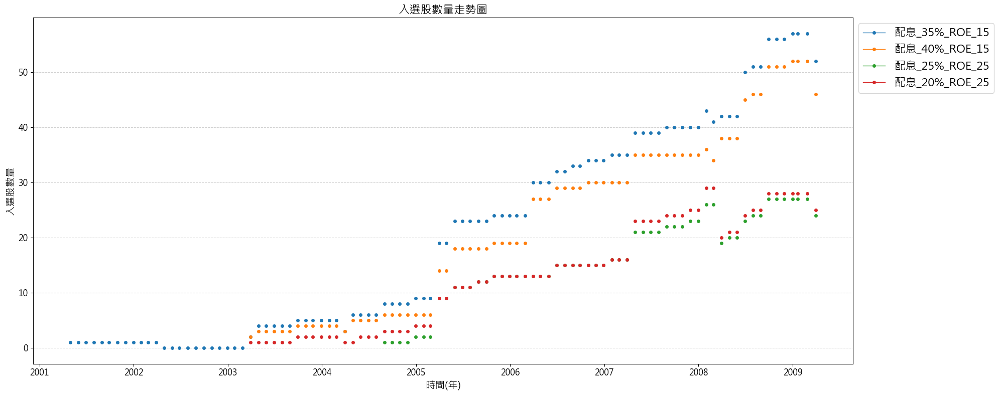

In [130]:
payout_PER_opts_comb.plot_reps_stock_counts(['配息_35%_ROE_15','配息_40%_ROE_15','配息_25%_ROE_25','配息_20%_ROE_25'])

In [133]:
payout_PER_opts_comb.reports['配息_35%_ROE_15'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,12.19%,39.53,-55.38%,51.16%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1303,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.023810,249,2061,2310,-0.411847,-0.522974,0.043362,0.043362,-0.542799,21.0,0.000000,0.000000
1473,2003-04-01,2009-04-01,2003-03-31,2009-03-31,0.500000,1491,819,2310,-0.259782,-0.358219,1.018494,1.018494,-0.682050,1315.0,0.000000,0.000000
1477,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.052632,991,1319,2310,0.145771,-0.260041,2.106229,2.106229,-0.761782,838.0,0.000000,0.000000
2002,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.052632,991,1319,2310,0.100460,-0.210383,1.376140,0.015704,-0.572777,757.0,0.000000,0.000000
2027,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.025641,476,1834,2310,-0.643627,-0.745723,0.103093,0.103093,-0.769487,42.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8072,2008-02-01,NaT,2008-01-31,NaT,0.023256,4097,2026,-1,-0.507691,-0.684128,0.409962,0.409962,-0.775971,933.0,0.019231,0.019231
8924,2005-04-01,NaT,2005-03-31,NaT,0.052632,4804,1319,-1,2.776022,-0.601674,5.249710,0.879408,-0.788058,2887.0,0.019231,0.019231
9917,2008-10-01,NaT,2008-09-30,NaT,0.017857,3935,2188,-1,5.448780,-0.234411,5.945744,0.064518,-0.280811,3824.0,0.019231,0.019231


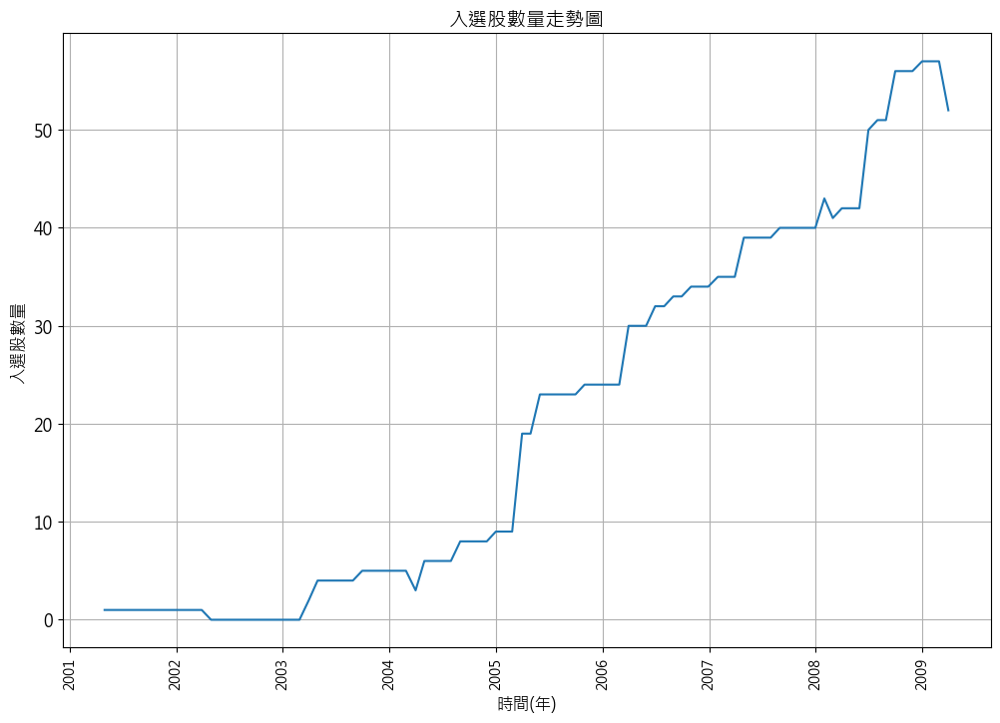

In [134]:
payout_PER_opts_comb.reports['配息_35%_ROE_15'].plot_company_counts()